In [3]:
import random
import secrets
import torch

from diffusers import KDPM2DiscreteScheduler, StableDiffusionXLPipeline, DPMSolverMultistepScheduler, AutoencoderKL
from fourier_vision_utils import register_free_upblock2d, register_free_crossattn_upblock2d
from PIL import Image
from super_image import EdsrModel, ImageLoader

In [4]:
#model_id = "./models/ThinkDiffusionXL.safetensors"
#model_id = "./models/betterThanWords_v20.safetensors"
#model_id = "./models/wowXLV2_v2.safetensors"
#model_id = "/mnt/e/image_models/juggernautXL_v9Rundiffusionphoto2.safetensors"

In [5]:
# load both base & refiner
#base = StableDiffusionXLPipeline.from_single_file(
base = StableDiffusionXLPipeline.from_pretrained(
    "RunDiffusion/Juggernaut-XL-v9",
    torch_dtype=torch.float16, variant="fp16", 
    use_safetensors=True, safety_checker=None,requires_safety_checker=False, 
    add_watermarker=False, custom_pipeline="lpw_stable_diffusion_xl"
)
#base.scheduler = KDPM2DiscreteScheduler.from_config(base.scheduler.config)
base.scheduler = DPMSolverMultistepScheduler.from_config(
                base.scheduler.config,
                algorithm_type="sde-dpmsolver++",
                use_karras_sigmas=True,
            )
base.to("cuda")
base.enable_xformers_memory_efficient_attention()

#base.enable_xformers_memory_efficient_attention()
#base.scheduler = KDPM2DiscreteScheduler.from_config(base.scheduler.config)

/home/gensyn/anaconda3/lib/python3.11/site-packages/huggingface_hub/file_download.py:678: FutureWarning: 'cached_download' is the legacy way to download files from the HF hub, please consider upgrading to 'hf_hub_download'
  warnings.warn(


Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

Keyword arguments {'safety_checker': None, 'requires_safety_checker': False} are not expected by SDXLLongPromptWeightingPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [6]:
def infer(prompt, prompt_2, sd_options, seed, b1, b2, s1, s2, pipe, negative_prompt, n_steps, guidance_scale, height, width):
    register_free_crossattn_upblock2d(pipe, b1=1.0, b2=1.0, s1=1.0, s2=1.0)
    
    torch.manual_seed(seed)
    print("Generating SD:")
    sd_image = pipe(
        prompt=prompt, prompt_2=prompt_2, negative_prompt=negative_prompt,
        num_inference_steps=n_steps, guidance_scale = guidance_scale, height=height, width=width
    ).images[0]  
    sd_image_prev = sd_image
    
    register_free_crossattn_upblock2d(pipe, b1=b1, b2=b2, s1=s1, s2=s1)

    torch.manual_seed(seed)
    print("Generating FreeU:")
    freeu_image = pipe(
        prompt=prompt, prompt_2=prompt_2, negative_prompt=negative_prompt,
        num_inference_steps=n_steps, guidance_scale = guidance_scale, height=height, width=width
    ).images[0]  

    # First SD, then freeu
    images = [sd_image, freeu_image]


    return images

def generate_image(pipe, prompt, prompt_2, negative_prompt, n_steps, guidance_scale, height, width, seed):
    # run both experts
    register_free_crossattn_upblock2d(pipe, b1=1.0, b2=1.0, s1=1.0, s2=1.0)
    torch.manual_seed(seed)
    #print("Generating SD:")
    image = pipe(
        prompt=prompt, prompt_2=prompt_2, negative_prompt=negative_prompt,
        num_inference_steps=n_steps, guidance_scale = guidance_scale, height=height, width=width
    ).images[0]  
    
    return image

def generate_freeU_image(pipe, prompt, prompt_2, negative_prompt, n_steps, guidance_scale, height, width, seed, b1, b2, s1, s2):
    # run both experts
    register_free_crossattn_upblock2d(pipe, b1=b1, b2=b2, s1=s1, s2=s1)
    torch.manual_seed(seed)
    #print("Generating FreeU:")
    freeu_image = pipe(
        prompt=prompt, prompt_2=prompt_2, negative_prompt=negative_prompt,
        num_inference_steps=n_steps, guidance_scale = guidance_scale, height=height, width=width
    ).images[0]  
    
    return freeu_image

#base.unet = torch.compile(base.unet, mode="reduce-overhead", fullgraph=True)
#refiner.unet = torch.compile(refiner.unet, mode="reduce-overhead", fullgraph=True)

  0%|          | 0/45 [00:00<?, ?it/s]

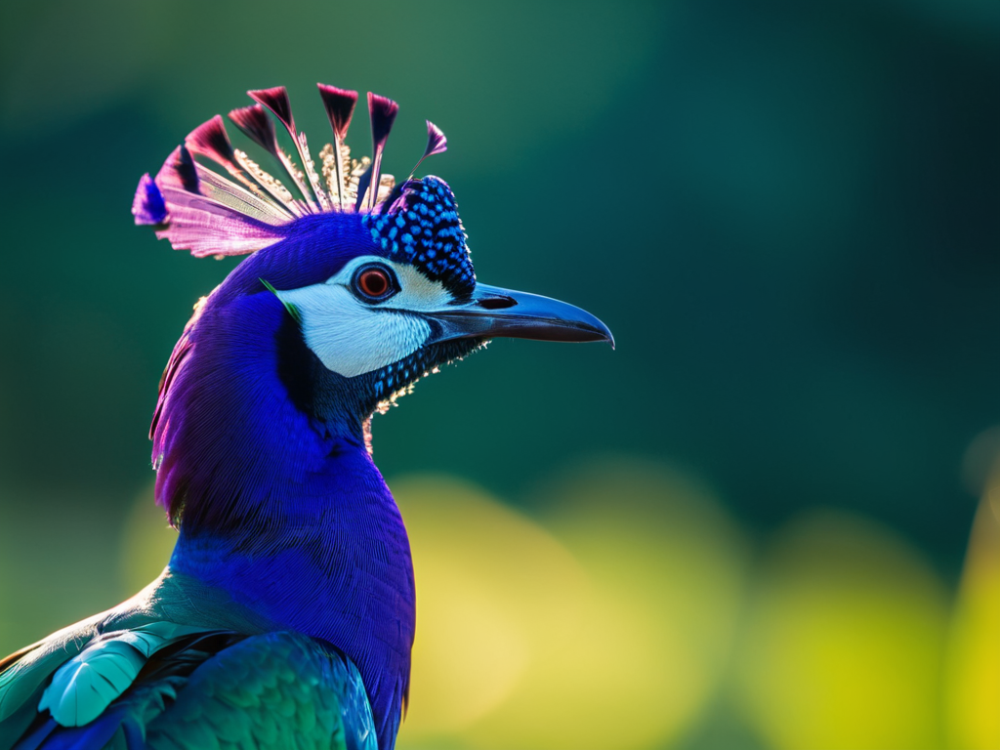

In [7]:
sd_options = 'SDXL'
b1 = 1.5
s1 = 0.5
b2 = 1.4
s2 = 0.4
# Your specified range
min_value = -0x8000_0000_0000_0000
max_value = 0xffff_ffff_ffff_ffff
# Generate a random number in the specified range
random_number = secrets.randbelow(max_value - min_value + 1) + min_value
seed = random_number
width = 1024
height = 768
prompt = "backlight, morning light, majestic exotic bird head, vibrant colorful blue green purple, nature documentary 8k"
prompt_2 = prompt
negative_prompt = "deformed, mutated, ugly, disfigured, cartoon, illustration"
guidance_scale = 7
n_steps = 45
image = generate_image(base, prompt, prompt_2, negative_prompt, n_steps, guidance_scale, height, width, seed)
image

  0%|          | 0/45 [00:00<?, ?it/s]

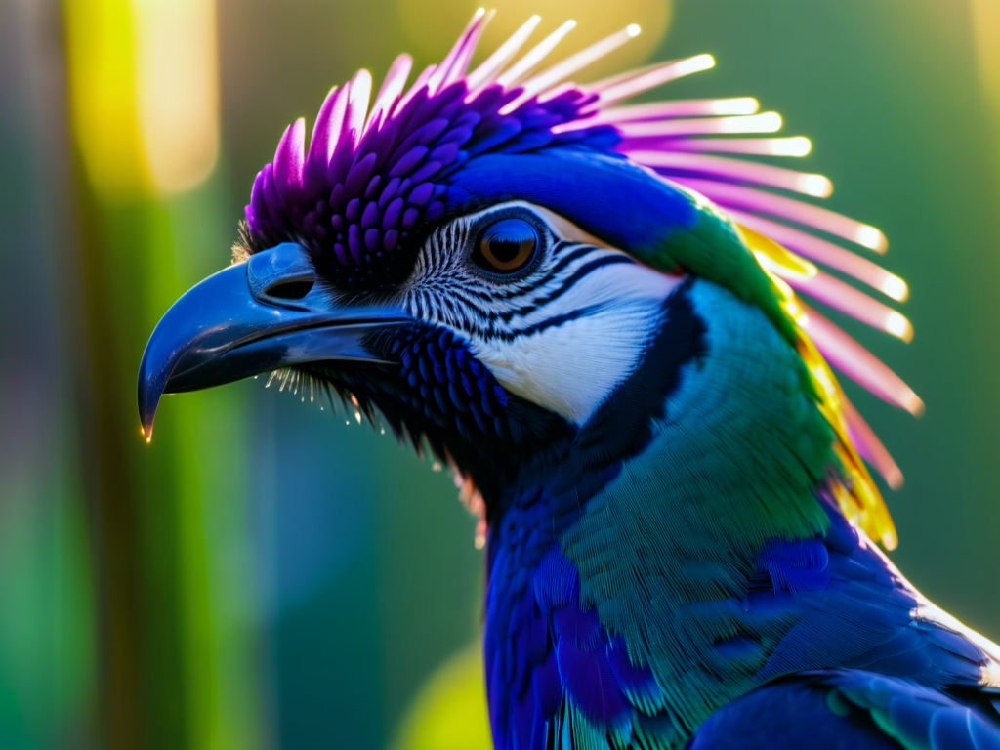

In [6]:
image = generate_freeU_image(base,  prompt, prompt_2, negative_prompt, n_steps, guidance_scale, height, width, seed, b1, b2, s1, s2)
image

  0%|          | 0/45 [00:00<?, ?it/s]

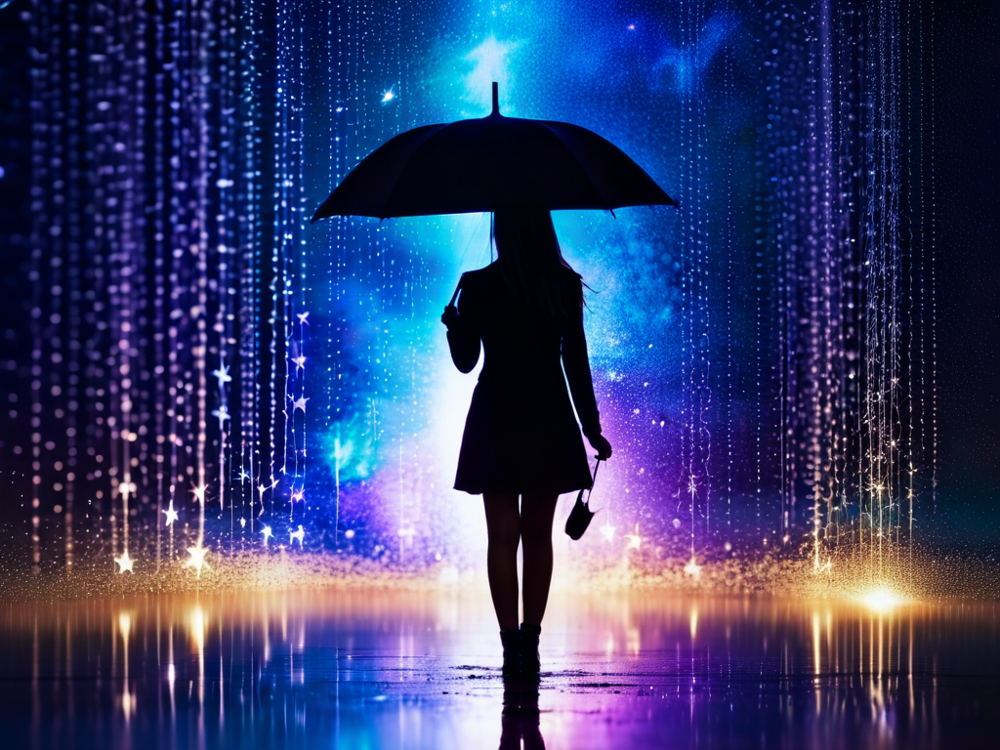

In [7]:
prompt = "Abstract magical rain, universe, stars, small woman silhouette with umbrella on the bottom"
prompt_2 = prompt
image = generate_freeU_image(base,  prompt, prompt_2, negative_prompt, n_steps, guidance_scale, height, width, seed, b1, b2, s1, s2)
image

  0%|          | 0/45 [00:00<?, ?it/s]

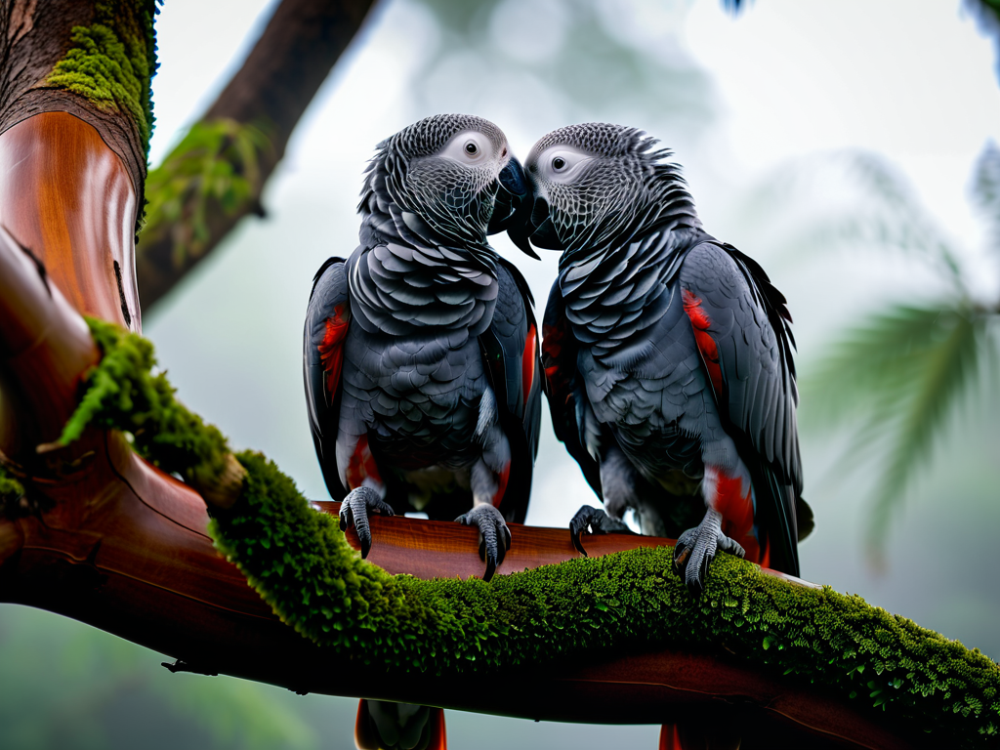

In [8]:
prompt = "8k, dslr photo, 2 african grey parrot cuddling , Canon 100mm F2.8, dawn, rainforest , tropical forest, mahogany tree, ebony tree, treebark, morning fog"
prompt_2 = prompt
negative_prompt = "make-up, drawing, painting, 3d, crayon, sketch, graphite, impressionist, noisy, blurry, soft, deformed, ugly, blurry, overexposed"
guidance_scale = 10
n_steps = 45
image = generate_freeU_image(base,  prompt, prompt_2, negative_prompt, n_steps, guidance_scale, height, width, seed, b1, b2, s1, s2)
image

  0%|          | 0/45 [00:00<?, ?it/s]

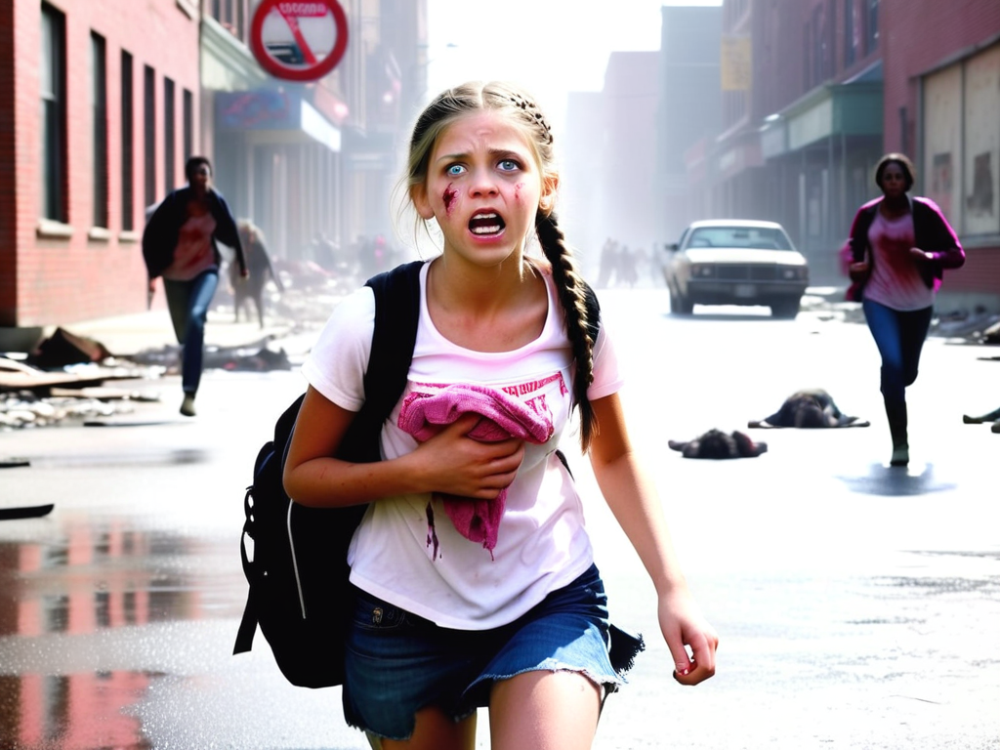

In [9]:
prompt = "nsfw, realistic (photo of a survivor girl, realistic skin, broken schoolgirl clothes, hair is plaits, pink backpack, open blouse small breasts, dirty face, scared face, beautiful clear eyes, white perfect teeth, looking behind the viewer, running to viewer, (barefoot):1, hand reaching out asking for help) high quality, masterpiece, background is destroyed snowed city with zombies, zombies in the background"
prompt_2 = prompt
negative_prompt = "FastNegativeV2,(bad-artist:1), tattoo (worst quality, low quality:1.4),(bad_prompt_version2:0.8),bad-hands-5,lowres,bad anatomy,bad hands,((text)),(watermark),error,missing fingers,extra digit,fewer digits,cropped,worst quality,low quality,normal quality,((username)),blurry,(extra limbs),bad-artist, anime,badhandv4, EasyNegative,ng_deepnegative_v1_75t, verybadimagenegative_v1.3, BadDream,(three hands:1.6),(three legs:1.2),(more than two hands:1.4),(more than two legs,:1.2),label,watermark,"
guidance_scale = 7
n_steps = 45
image = generate_freeU_image(base,  prompt, prompt_2, negative_prompt, n_steps, guidance_scale, height, width, seed, b1, b2, s1, s2)
image

  0%|          | 0/45 [00:00<?, ?it/s]

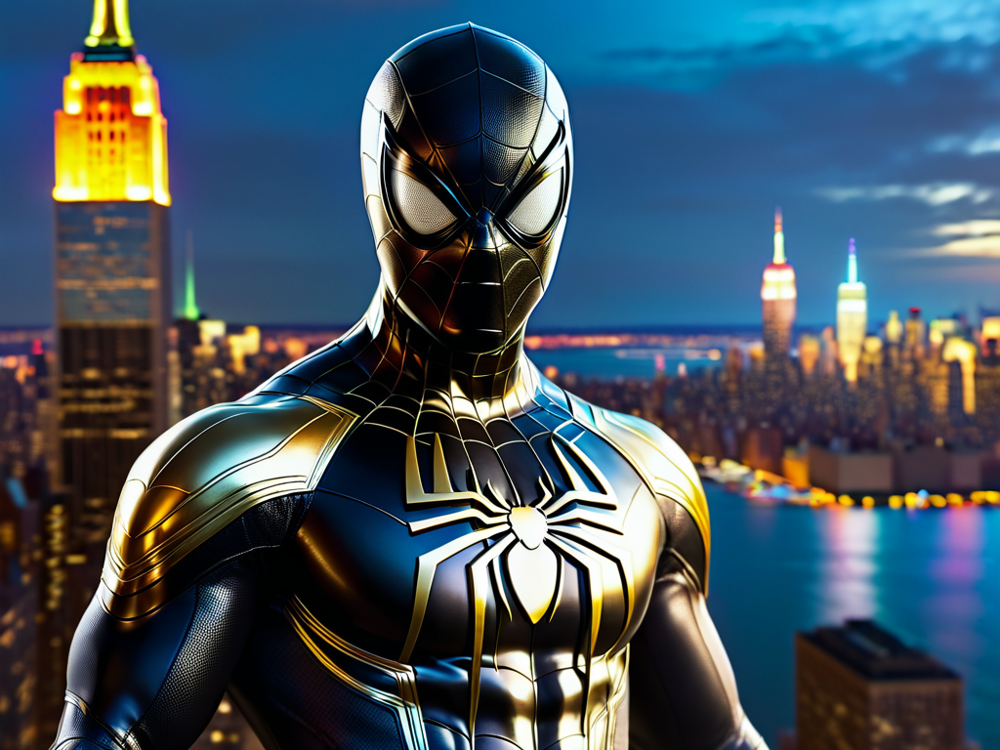

In [10]:
prompt = "Portrait painting of Spider-Man wearing a (stunning VANTA-BLACK and gold suit), ultra realistic, concept art, eerie, highly detailed, photorealistic, art by artgerm and Jim Lee, NYC in the background, Full Body, Night time, HDR10, 8k hdr, RAW, remarkable color, hyperrealistic, (intricate details), deep shadows, contrast,"
prompt_2 = prompt
negative_prompt = "(worst quality, low quality, normal quality, lowres, low details, oversaturated, undersaturated, overexposed, underexposed, bad photo, bad photography, bad art:1.4), (watermark, signature, text font, username, error, logo, words, letters, digits, autograph, trademark, name:1.2), (blur, blurry, grainy), morbid, ugly, asymmetrical, mutated malformed, mutilated, poorly lit, bad shadow, draft, cropped, out of frame, cut off, censored, jpeg artifacts, out of focus, glitch, duplicate, (bad hands, bad anatomy, bad body, bad face, bad teeth, bad arms, bad legs, deformities:1.3)"
guidance_scale = 7
n_steps = 45
image = generate_freeU_image(base,  prompt, prompt_2, negative_prompt, n_steps, guidance_scale, height, width, seed, b1, b2, s1, s2)
image

  0%|          | 0/45 [00:00<?, ?it/s]

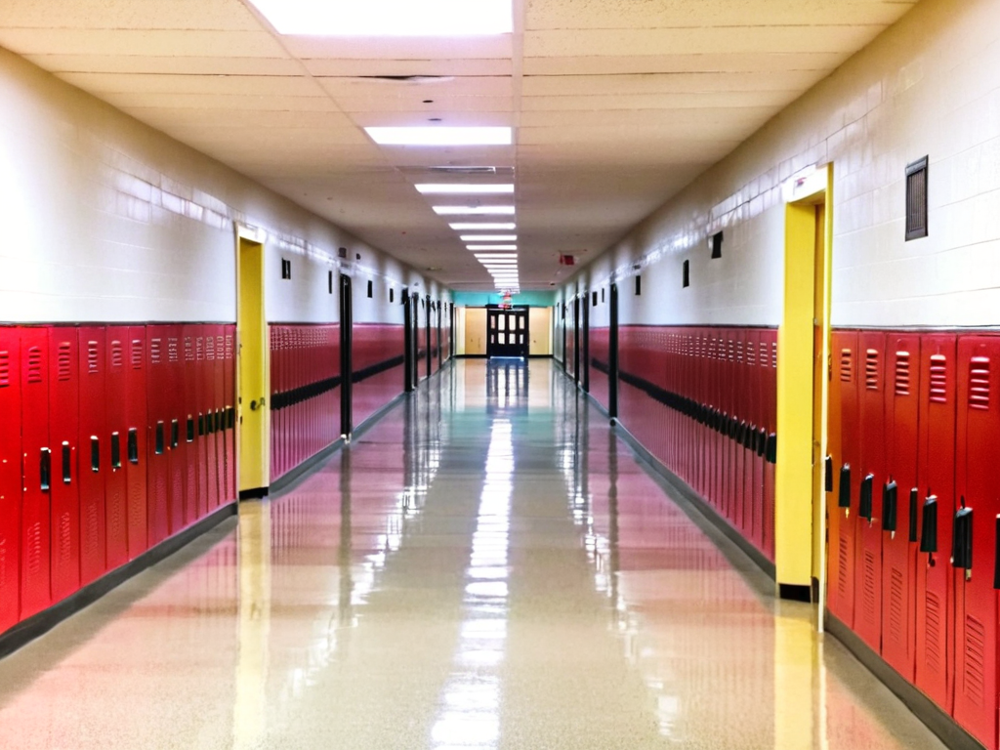

In [11]:
# Generate a random number in the specified range
random_number = secrets.randbelow(max_value - min_value + 1) + min_value
seed = random_number

prompt = "An illstuation about: The bell rang in the small town high school, echoing through the emptying hallways."
prompt_2 = prompt
negative_prompt = "(worst quality, low quality, normal quality, lowres, low details, oversaturated, undersaturated, overexposed, underexposed, bad photo, bad photography, bad art:1.4), (watermark, signature, text font, username, error, logo, words, letters, digits, autograph, trademark, name:1.2), (blur, blurry, grainy), morbid, ugly, asymmetrical, mutated malformed, mutilated, poorly lit, bad shadow, draft, cropped, out of frame, cut off, censored, jpeg artifacts, out of focus, glitch, duplicate, text, titles, captions, (bad hands, bad anatomy, bad body, bad face, bad teeth, bad arms, bad legs, deformities:1.3)"
guidance_scale = 6
n_steps = 45
image = generate_freeU_image(base,  prompt, prompt_2, negative_prompt, n_steps, guidance_scale, height, width, seed, b1, b2, s1, s2)
image